In [116]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import os


In [117]:
# Read the CSV file
df_user = pd.read_csv('/Users/naroacorettisanchez/Documents/GitHub/MultifunctionalVehicleFleets/includes/Demand/user_demand_cambridge_oct7_2019_week.csv')
df_food= pd.read_csv('/Users/naroacorettisanchez/Documents/GitHub/MultifunctionalVehicleFleets/includes/Demand/food_demand_cambridge_week.csv')

In [118]:
df_food.columns

Index(['activity_id', 'start_latitude', 'start_longitude', 'end_latitude',
       'end_longitude', 'travel_purpose', 'start_time', 'end_time',
       'duration_minutes', 'distance_miles', 'start_hour', 'same_place',
       'day'],
      dtype='object')

In [119]:
# Convert the start_time column to datetime
df_food['start_time_ed'] = pd.to_datetime(df_food['start_time'])

df_food['start_time'] = '2022/11/' + df_food['day'].astype(str) + ' ' + df_food['start_time_ed'].dt.strftime('%H:%M:%S')

df_food['start_time'] = pd.to_datetime(df_food['start_time'], format='%Y/%m/%d %H:%M:%S')

# Set 'start_time' as the index
df_food.set_index('start_time', inplace=True)

# Resample the DataFrame with a frequency of 3 hours and create a list of DataFrames
df_list_food = [group for _, group in df_food.groupby(pd.Grouper(freq='1H'))]

In [120]:
len(df_list_food)

168

In [121]:
df_user.columns

Index(['tripduration', 'starttime', 'stoptime', 'start station id',
       'start station name', 'start station latitude',
       'start station longitude', 'end station id', 'end station name',
       'end station latitude', 'end station longitude', 'bikeid', 'usertype',
       'birth year', 'gender', 'start_building', 'start_lon', 'start_lat',
       'target_building', 'target_lon', 'target_lat', 'start_time',
       'target_time', 'withinC', 'withinCend'],
      dtype='object')

In [122]:
# Convert the 'Fecha de fin' column to a datetime object if it's not already
df_user['starttime'] = pd.to_datetime(df_user['starttime'])

# Set the 'Fecha de fin' column as the index
df_user.set_index('starttime', inplace=True)

# Resample the DataFrame with a frequency of 3 hours and create a list of DataFrames
df_list_user = [group for _, group in df_user.groupby(pd.Grouper(freq='1H'))]


In [123]:
df_user = df_list_user[0]

In [124]:

def generate_hexbin(x_data_start, y_data_start, x_data_end, y_data_end):
    # Specify the hexbin parameters
    gridsize = 3
    
    # Compute hexbin counts for start points
    counts_start, x_edges, y_edges = np.histogram2d(x_data_start, y_data_start, bins=gridsize)
    
    # Compute hexbin counts for end points
    counts_end, _, _ = np.histogram2d(x_data_end, y_data_end, bins=(x_edges, y_edges))
    
    # Get hexbin centers
    x_centers = (x_edges[:-1] + x_edges[1:]) / 2
    y_centers = (y_edges[:-1] + y_edges[1:]) / 2

    
    # Create a DataFrame with centers, start counts, and end counts
    df_hexbin = pd.DataFrame({
        'center_x': np.repeat(x_centers, gridsize),
        'center_y': np.tile(y_centers, gridsize),
        'count_start': counts_start.flatten(),
        'count_end': counts_end.flatten()
    })
    
    # Add a new column for the difference between count_end and count_start
    df_hexbin['count_diff'] = df_hexbin['count_end'] - df_hexbin['count_start']
    
    return df_hexbin

df_counts_user = []

# Iterate through the list of DataFrames
for df_user in df_list_user:
    # Generate hexbin counts for start and end points
    df_centers_counts = generate_hexbin(df_user['start_lon'], df_user['start_lat'], df_user['target_lon'], df_user['target_lat'])
    
    # Append the resulting DataFrame to the list
    df_counts_user.append(df_centers_counts)



df_counts_food = []

# Iterate through the list of DataFrames
for df_food in df_list_food:
    # Generate hexbin counts for start and end points
    df_centers_counts = generate_hexbin(df_food['start_longitude'], df_food['start_latitude'], df_food['end_longitude'], df_food['end_latitude'])
    
    # Append the resulting DataFrame to the list
    df_counts_food.append(df_centers_counts)




In [125]:
len(df_counts_food)

168

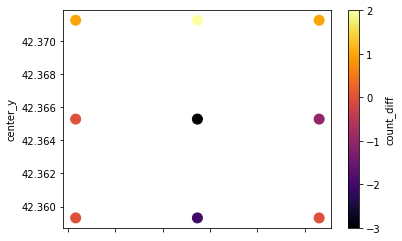

In [126]:
df_counts_user[0].plot.scatter(x='center_x', y='center_y', c='count_diff', cmap='inferno', s=100)
plt.show()

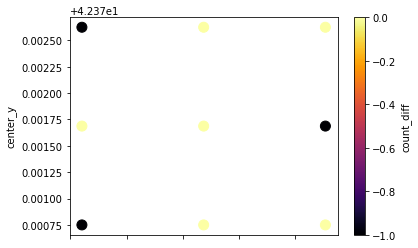

In [127]:
df_counts_food[0].plot.scatter(x='center_x', y='center_y', c='count_diff', cmap='inferno', s=100)
plt.show()

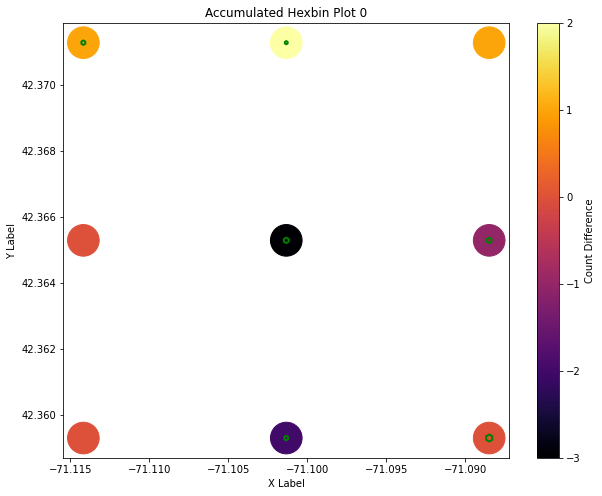

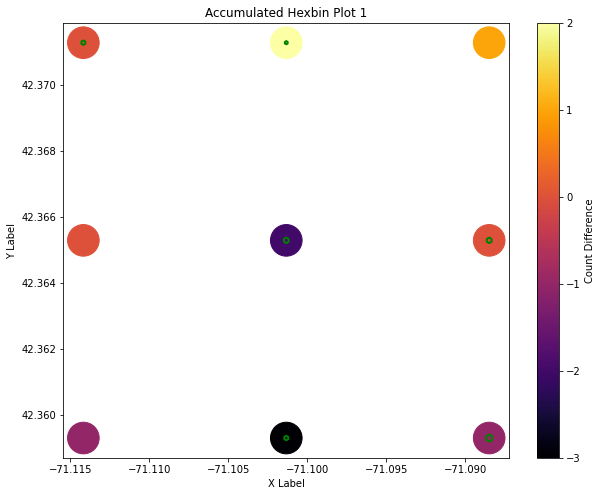

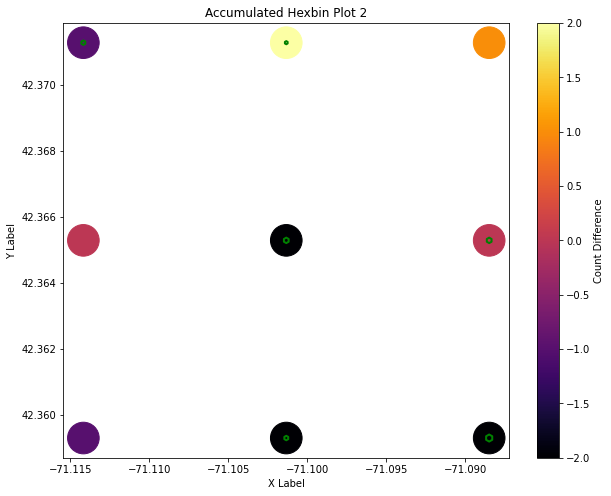

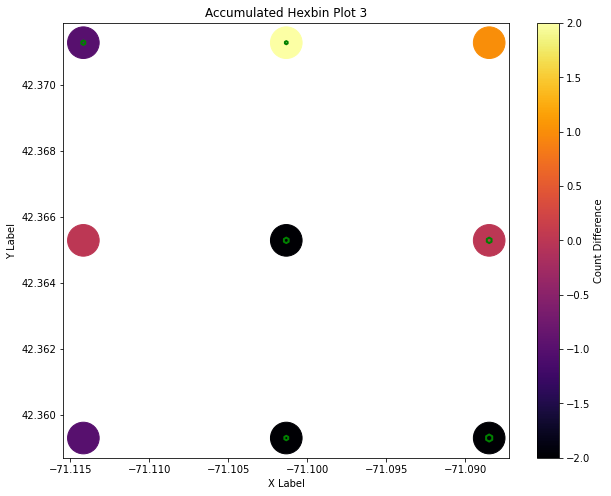

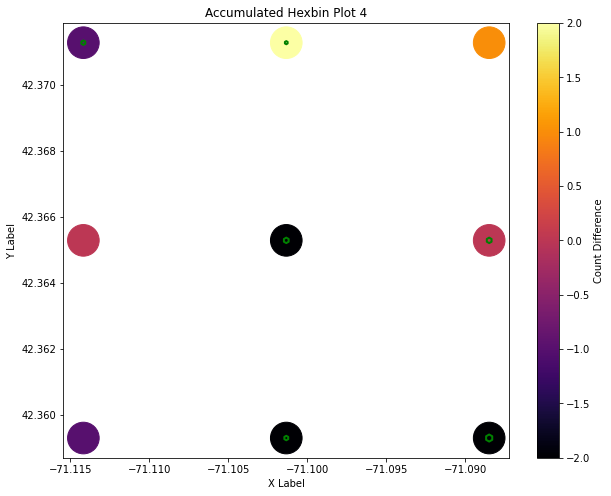

...

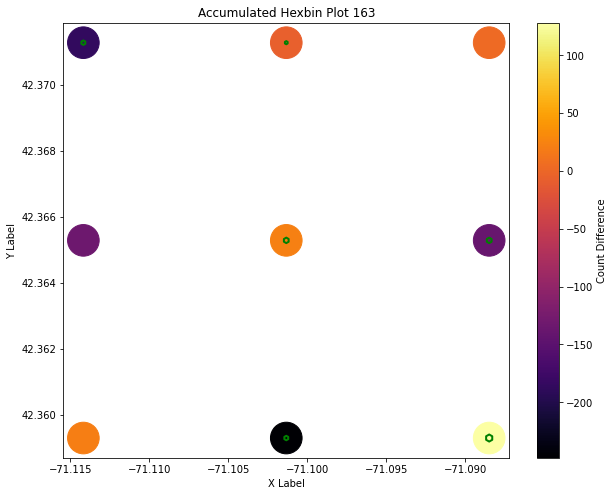

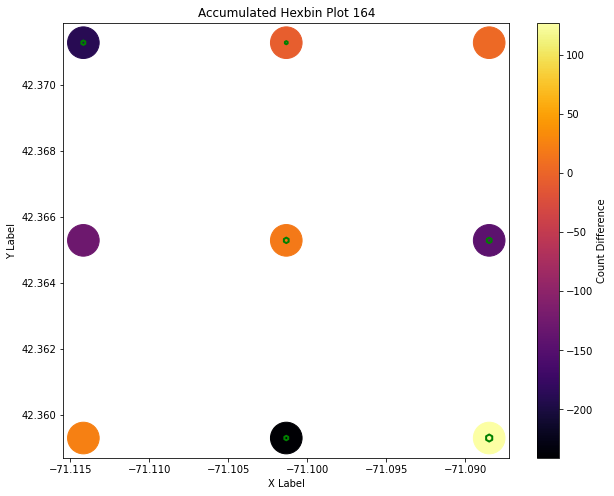

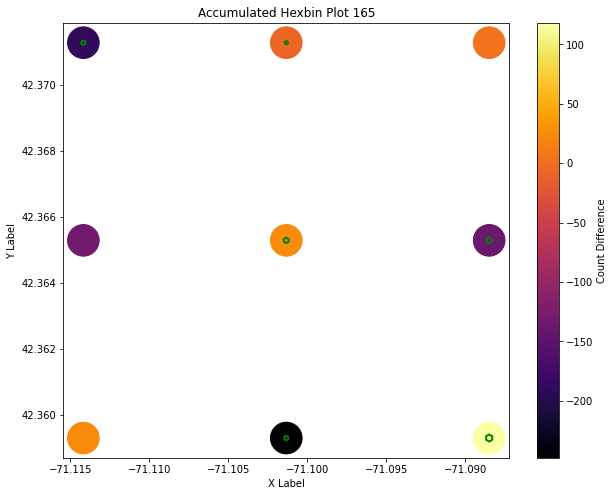

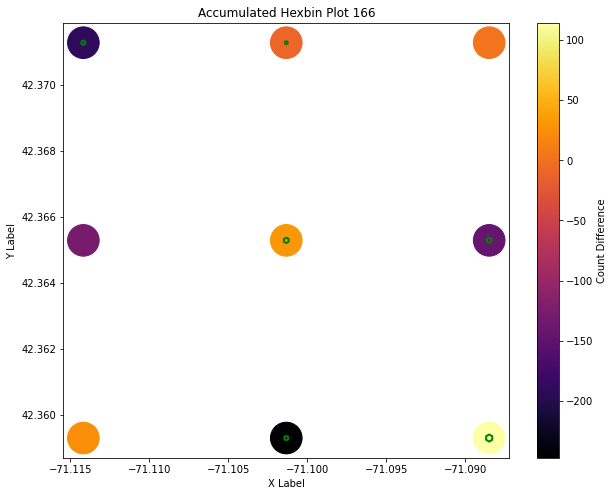

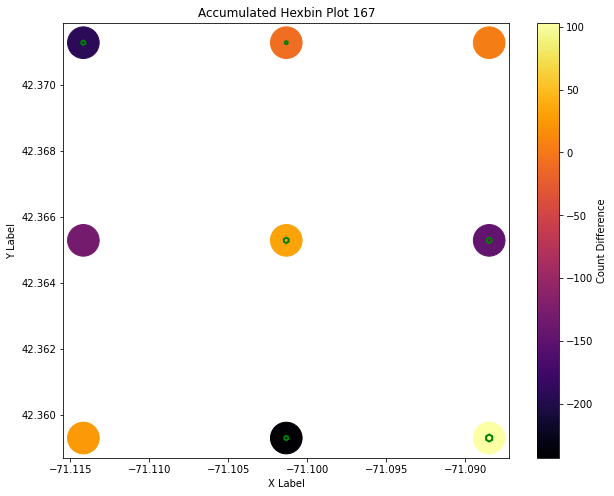

    center_x   center_y  count_start  count_end  count_diff  \
0 -71.114165  42.359308          0.0        0.0         0.0   
1 -71.114165  42.365297          0.0        0.0         0.0   
2 -71.114165  42.371286          2.0        3.0         1.0   
3 -71.101333  42.359308          2.0        0.0        -2.0   
4 -71.101333  42.365297          3.0        0.0        -3.0   
5 -71.101333  42.371286          1.0        3.0         2.0   
6 -71.088502  42.359308          5.0        5.0         0.0   
7 -71.088502  42.365297          3.0        2.0        -1.0   
8 -71.088502  42.371286          0.0        1.0         1.0   

   count_diff_accumulated  
0                    25.0  
1                  -130.0  
2                  -191.0  
3                  -243.0  
4                    32.0  
5                    -8.0  
6                   103.0  
7                  -146.0  
8                     4.0  


In [128]:
# Create a folder to store the images (if it doesn't exist)
output_folder = '/Users/naroacorettisanchez/Documents/GitHub/MultifunctionalVehicleFleets/results/BALANCE_MATRICES/small/user_ca_balance'
os.makedirs(output_folder, exist_ok=True)

# Initialize df_accumulated_user with the first DataFrame
df_accumulated_user = df_counts_user[0].copy()
df_accumulated_user['count_diff_accumulated'] = 0

df_all_user = []
df_temp = pd.DataFrame()

# Iterate through the list of DataFrames (starting from the second DataFrame)
for i in range(len(df_counts_user)):
    # Accumulate the values for count_diff
    df_accumulated_user['count_diff_accumulated'] += df_counts_user[i]['count_diff']

    df_temp = df_counts_user[i].copy() 
    df_temp['count_diff_accumulated'] = df_accumulated_user['count_diff_accumulated'].copy()
    df_all_user.append(df_temp)
    
    # Plot and save the image
    plt.figure(figsize=(10, 8))
    plt.scatter(df_accumulated_user['center_x'], df_accumulated_user['center_y'], c=df_accumulated_user['count_diff_accumulated'], cmap='inferno', s=1000)
    plt.xlabel('X Label')
    plt.ylabel('Y Label')
    plt.title(f'Accumulated Hexbin Plot {i}')
    plt.colorbar(label='Count Difference')
    

    #Add the gap with the demand
    plt.scatter(df_accumulated_user['center_x'], df_accumulated_user['center_y'], s=df_accumulated_user['count_start']*10, marker='h',facecolors='none', edgecolors='green', linewidths=2)
    
    # Save the plot as an image in the output folder
    output_path = os.path.join(output_folder, f'hexbin_plot_{i}.png')
    plt.savefig(output_path)

    # Show the plot if needed
    plt.show()

    # Close the current figure to free up resources
    plt.close()

# Display the accumulated DataFrame
print(df_accumulated_user)

In [129]:
for df in df_all_user:
    df['deficit'] = 0
    for i in range(len(df)):
        if df['count_diff_accumulated'][i] < 0:
            df['deficit'][i] = - df['count_diff'][i]
        else:
            df['deficit'][i] =  - df['count_diff'][i] - df['count_diff_accumulated'][i]

        if df['deficit'][i] < 0:
            df['deficit'][i] = 0

print(df_all_user[0])

total_deficit_user = 0

# Iterate through each DataFrame in df_all_user
for df in df_all_user:
    total_deficit_user += df['deficit'].sum()

print(total_deficit_user)

/Users/naroacorettisanchez/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys
/Users/naroacorettisanchez/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
/Users/naroacorettisanchez/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/st

    center_x   center_y  count_start  count_end  count_diff  \
0 -71.114165  42.359308          0.0        0.0         0.0   
1 -71.114165  42.365297          0.0        0.0         0.0   
2 -71.114165  42.371286          2.0        3.0         1.0   
3 -71.101333  42.359308          2.0        0.0        -2.0   
4 -71.101333  42.365297          3.0        0.0        -3.0   
5 -71.101333  42.371286          1.0        3.0         2.0   
6 -71.088502  42.359308          5.0        5.0         0.0   
7 -71.088502  42.365297          3.0        2.0        -1.0   
8 -71.088502  42.371286          0.0        1.0         1.0   

   count_diff_accumulated  deficit  
0                     0.0        0  
1                     0.0        0  
2                     1.0        0  
3                    -2.0        2  
4                    -3.0        3  
5                     2.0        0  
6                     0.0        0  
7                    -1.0        1  
8                     1.0        0  

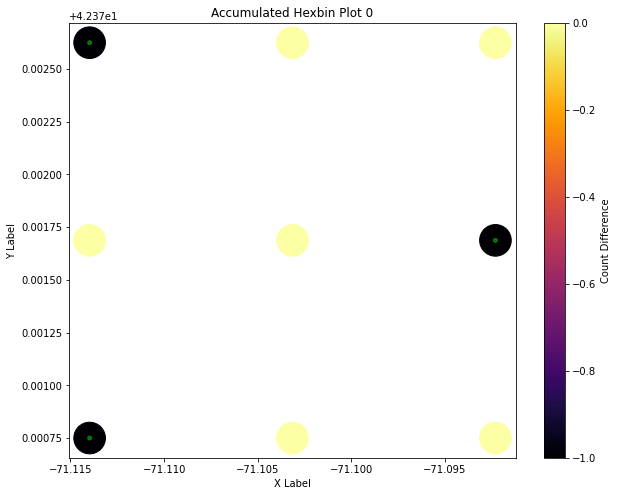

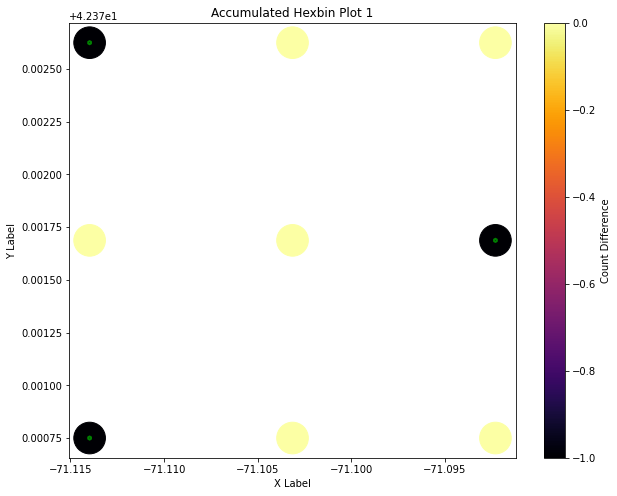

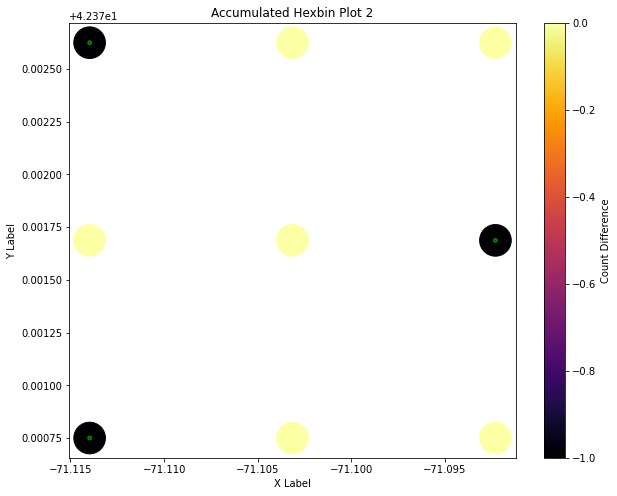

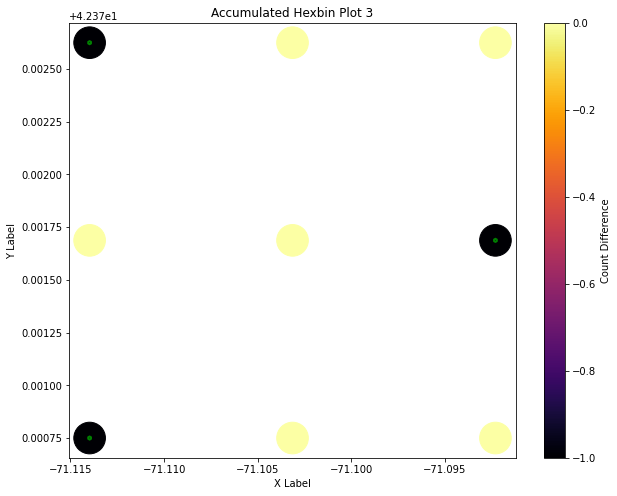

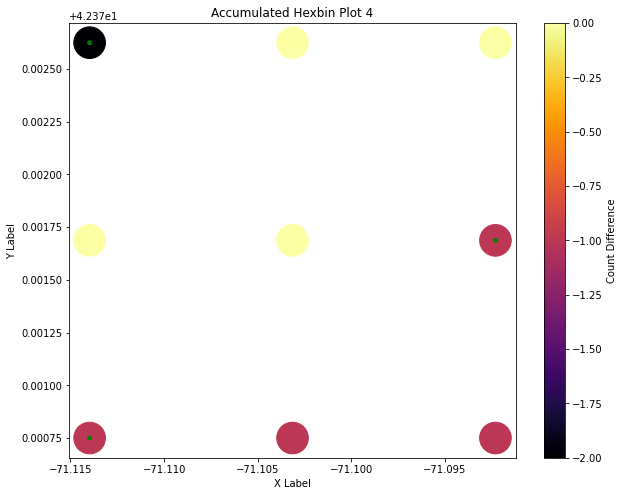

...

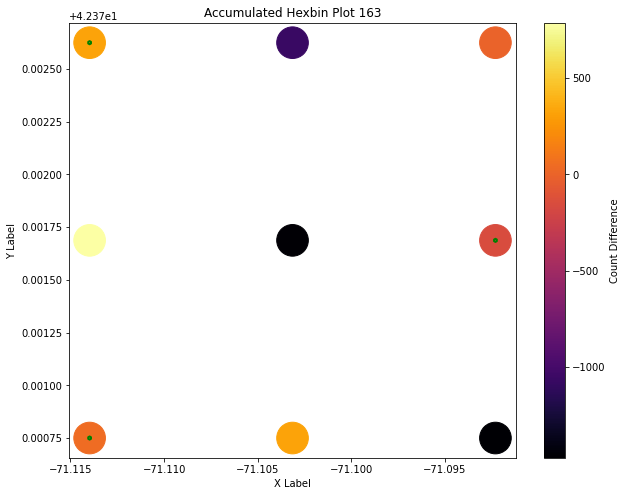

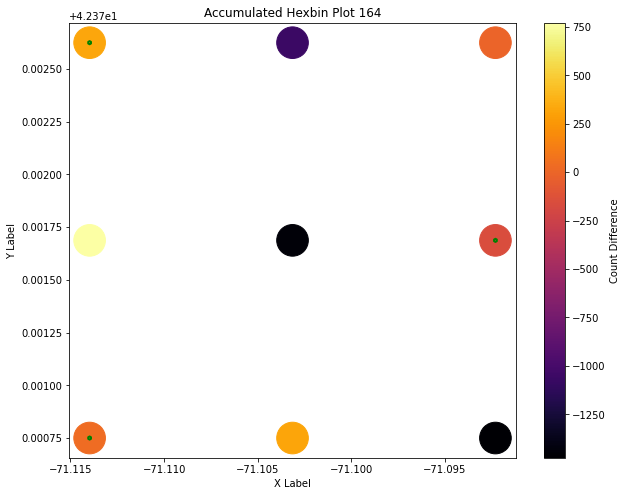

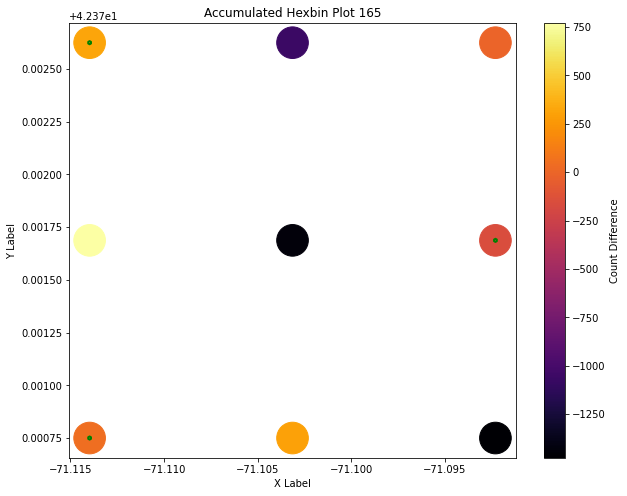

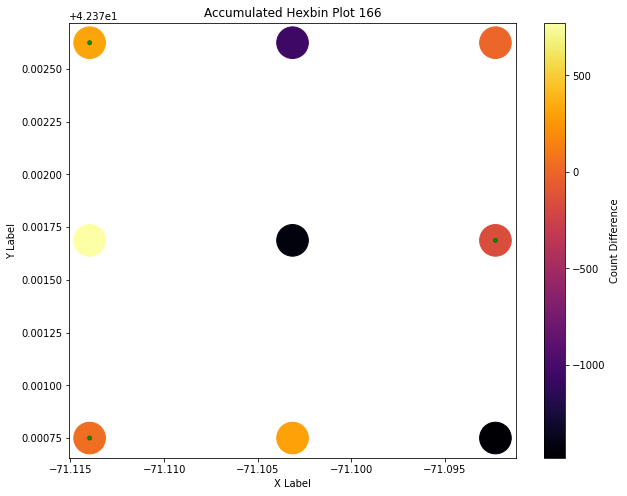

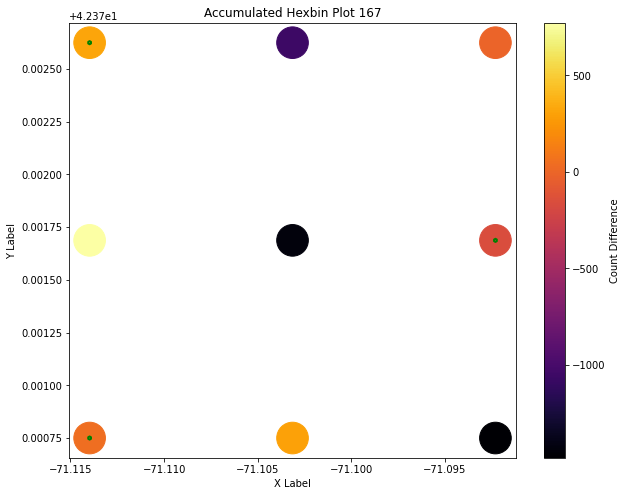

    center_x   center_y  count_start  count_end  count_diff  \
0 -71.113978  42.370750          1.0        0.0        -1.0   
1 -71.113978  42.371687          0.0        0.0         0.0   
2 -71.113978  42.372624          1.0        0.0        -1.0   
3 -71.103140  42.370750          0.0        0.0         0.0   
4 -71.103140  42.371687          0.0        0.0         0.0   
5 -71.103140  42.372624          0.0        0.0         0.0   
6 -71.092303  42.370750          0.0        0.0         0.0   
7 -71.092303  42.371687          1.0        0.0        -1.0   
8 -71.092303  42.372624          0.0        0.0         0.0   

   count_diff_accumulated  
0                    44.0  
1                   771.0  
2                   321.0  
3                   301.0  
4                 -1436.0  
5                 -1056.0  
6                 -1480.0  
7                  -155.0  
8                    -4.0  


In [130]:
# Create a folder to store the images (if it doesn't exist)
output_folder = '/Users/naroacorettisanchez/Documents/GitHub/MultifunctionalVehicleFleets/results/BALANCE_MATRICES/small/food_ca_balance'
os.makedirs(output_folder, exist_ok=True)

# Initialize df_accumulated_food with the first DataFrame
df_accumulated_food = df_counts_food[0].copy()
df_accumulated_food['count_diff_accumulated'] = 0

df_all_food = []
df_temp = pd.DataFrame()

# Iterate through the list of DataFrames (starting from the second DataFrame)
for i in range(len(df_counts_food)):
    # Accumulate the values for count_diff
    df_accumulated_food['count_diff_accumulated'] += df_counts_food[i]['count_diff']

    df_temp = df_counts_food[i].copy() 
    df_temp['count_diff_accumulated'] = df_accumulated_food['count_diff_accumulated'].copy()
    df_all_food.append(df_temp)


    # Plot and save the image
    plt.figure(figsize=(10, 8))
    plt.scatter(df_accumulated_food['center_x'], df_accumulated_food['center_y'], c=df_accumulated_food['count_diff_accumulated'], cmap='inferno', s=1000)
    plt.xlabel('X Label')
    plt.ylabel('Y Label')
    plt.title(f'Accumulated Hexbin Plot {i}')
    plt.colorbar(label='Count Difference')
    

    #Add the gap with the demand
    plt.scatter(df_accumulated_food['center_x'], df_accumulated_food['center_y'], s=df_accumulated_food['count_start']*10, marker='h',facecolors='none', edgecolors='green', linewidths=2)

    # Save the plot as an image in the output folder
    output_path = os.path.join(output_folder, f'hexbin_plot_{i}.png')
    plt.savefig(output_path)

    # Show the plot if needed
    plt.show()

    # Close the current figure to free up resources
    plt.close()

# Display the accumulated DataFrame
print(df_accumulated_food)

In [131]:

for df in df_all_food:
    df['deficit'] = 0
    for i in range(len(df)):

        if df['count_diff_accumulated'][i] < 0:
            df['deficit'][i] = - df['count_diff'][i]
        else:
            df['deficit'][i] =  - df['count_diff'][i] - df['count_diff_accumulated'][i]

        if df['deficit'][i] < 0:
            df['deficit'][i] = 0

print(df_all_food[10])

total_deficit_food = 0

# Iterate through each DataFrame in df_all_food
for df in df_all_food:
    total_deficit_food += df['deficit'].sum()

print(total_deficit_food)

/Users/naroacorettisanchez/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/Users/naroacorettisanchez/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/Users/naroacorettisanchez/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


    center_x   center_y  count_start  count_end  count_diff  \
0 -71.136653  42.364551          0.0        0.0         0.0   
1 -71.136653  42.377661          7.0       19.0        12.0   
2 -71.136653  42.390771          2.0        8.0         6.0   
3 -71.111767  42.364551         31.0       33.0         2.0   
4 -71.111767  42.377661         57.0       41.0       -16.0   
5 -71.111767  42.390771         25.0       14.0       -11.0   
6 -71.086882  42.364551         51.0       44.0        -7.0   
7 -71.086882  42.377661         10.0        7.0        -3.0   
8 -71.086882  42.390771          0.0        0.0         0.0   

   count_diff_accumulated  deficit  
0                    -1.0        0  
1                    29.0        0  
2                    26.0        0  
3                    27.0        0  
4                   -52.0       16  
5                   -52.0       11  
6                   -88.0        7  
7                    -4.0        3  
8                     0.0        0  

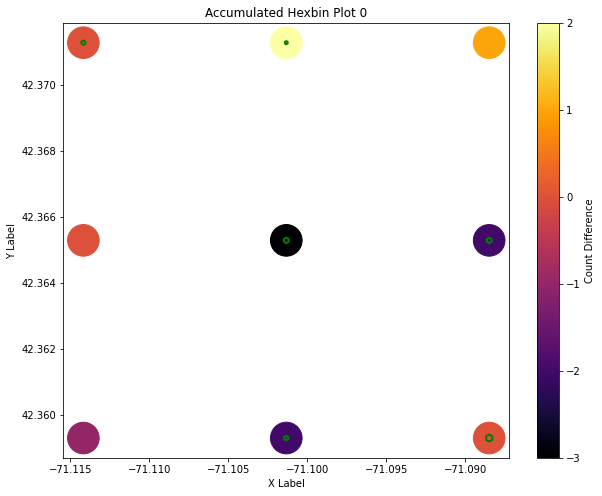

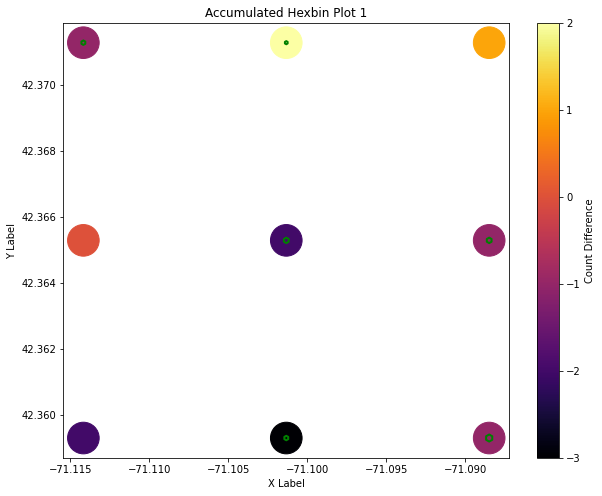

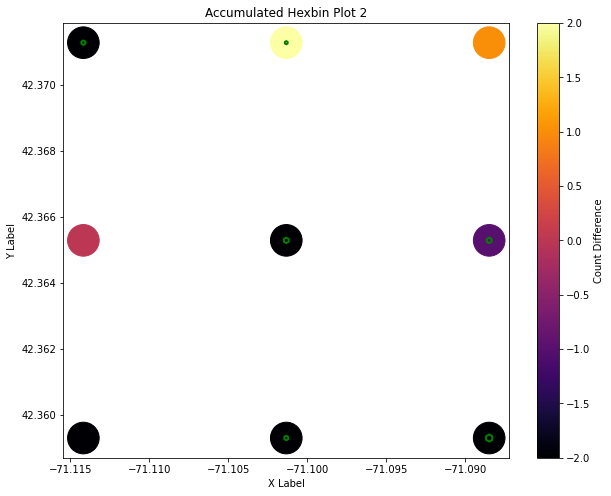

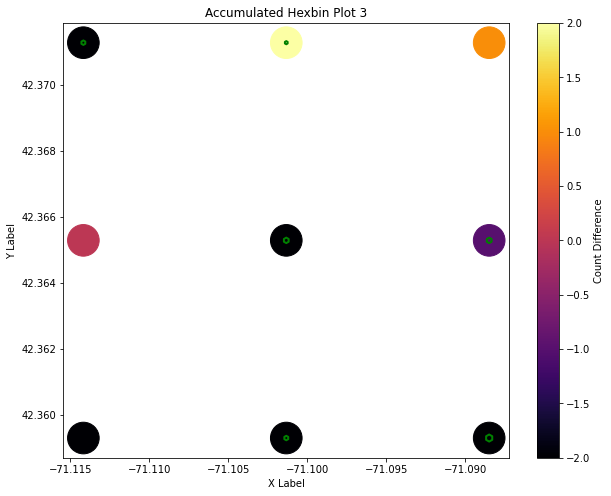

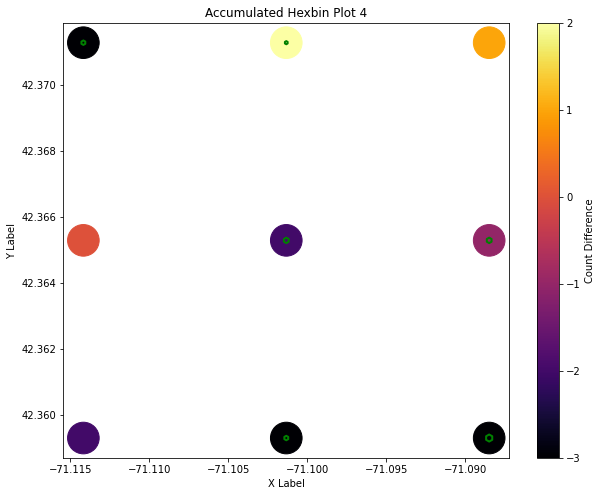

...

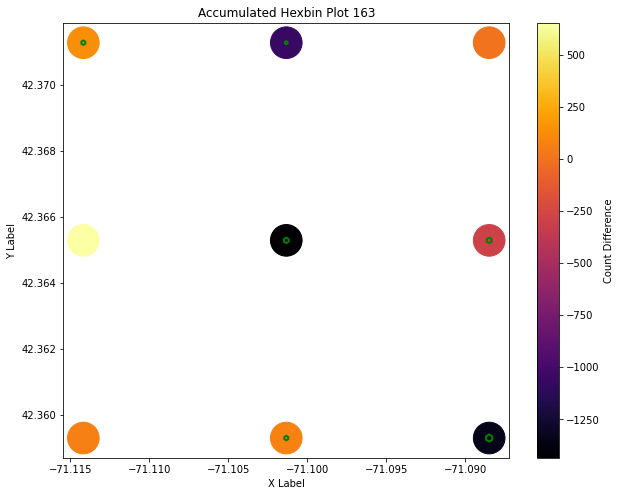

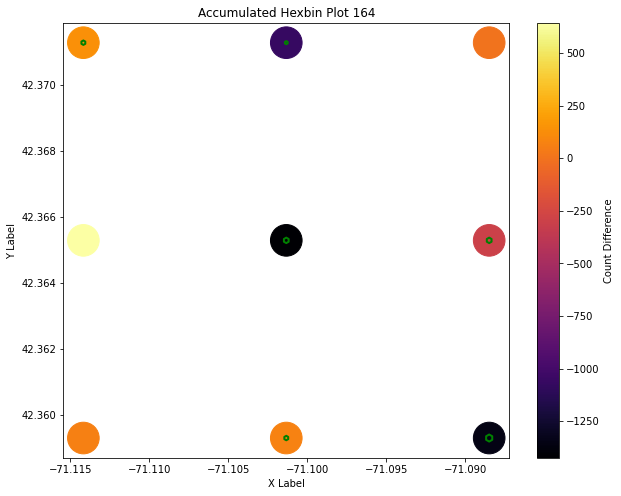

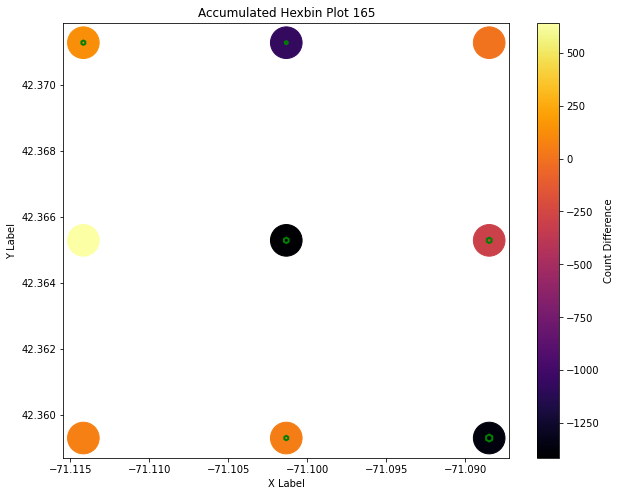

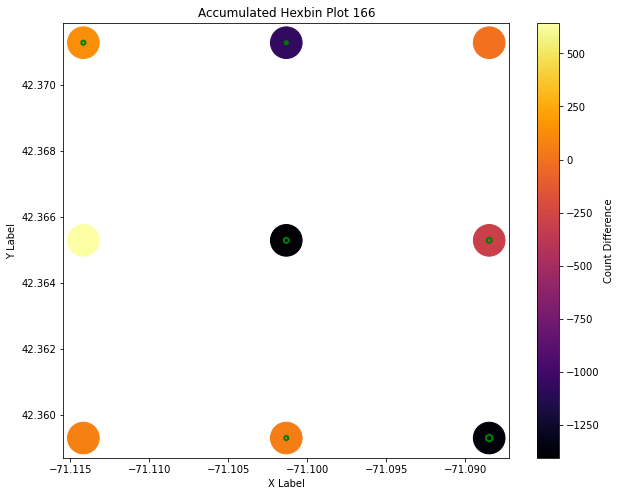

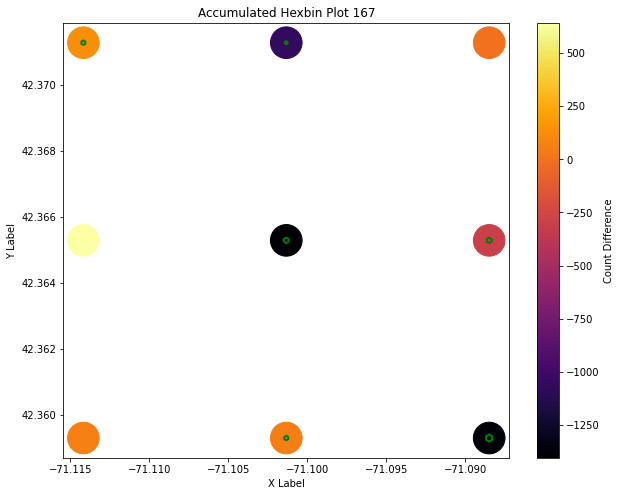

    center_x   center_y  count_start  count_end  count_diff  \
0 -71.114165  42.359308          0.0        0.0         0.0   
1 -71.114165  42.365297          0.0        0.0         0.0   
2 -71.114165  42.371286          2.0        3.0         1.0   
3 -71.101333  42.359308          2.0        0.0        -2.0   
4 -71.101333  42.365297          3.0        0.0        -3.0   
5 -71.101333  42.371286          1.0        3.0         2.0   
6 -71.088502  42.359308          5.0        5.0         0.0   
7 -71.088502  42.365297          3.0        2.0        -1.0   
8 -71.088502  42.371286          0.0        1.0         1.0   

   count_diff_accumulated  
0                    69.0  
1                   641.0  
2                   130.0  
3                    58.0  
4                 -1404.0  
5                 -1064.0  
6                 -1377.0  
7                  -301.0  
8                     0.0  


In [132]:
# Create a folder to store the images (if it doesn't exist)
output_folder = '/Users/naroacorettisanchez/Documents/GitHub/MultifunctionalVehicleFleets/results/BALANCE_MATRICES/small/mixed_ca_balance'
os.makedirs(output_folder, exist_ok=True)

# Initialize df_accumulated_food with the first DataFrame
df_accumulated = df_counts_user[0].copy()
df_accumulated['count_diff_accumulated'] = 0

df_all_mixed = []
df_temp = pd.DataFrame()

# Iterate through the list of DataFrames (starting from the second DataFrame)
for i in range(len(df_counts_user)):

    # Accumulate the values for count_diff
    df_accumulated['count_diff_accumulated'] += df_counts_user[i]['count_diff']
    df_accumulated['count_diff_accumulated'] += df_counts_food[i]['count_diff'] 

    df_temp = df_counts_food[i].copy() 
    df_temp['counts_start_user'] = df_counts_user[i]['count_start'].copy()
    df_temp['counts_start_food'] = df_counts_food[i]['count_start'].copy()
    df_temp['count_diff_user'] = df_counts_user[i]['count_diff'].copy()
    df_temp['count_diff_food'] = df_counts_food[i]['count_diff'].copy()
    df_temp['count_diff_accumulated'] = df_accumulated['count_diff_accumulated'].copy()
    df_all_mixed.append(df_temp)

    # Plot and save the image
    plt.figure(figsize=(10, 8))
    plt.scatter(df_accumulated['center_x'], df_accumulated['center_y'], c=df_accumulated['count_diff_accumulated'], cmap='inferno', s=1000)
    plt.xlabel('X Label')
    plt.ylabel('Y Label')
    plt.title(f'Accumulated Hexbin Plot {i}')
    plt.colorbar(label='Count Difference')


    #Add the gap with the demand
    plt.scatter(df_accumulated['center_x'], df_accumulated['center_y'], s=df_accumulated['count_start']*10, marker='h',facecolors='none', edgecolors='green', linewidths=2)
    
    # Save the plot as an image in the output folder
    output_path = os.path.join(output_folder, f'hexbin_plot_{i}.png')
    plt.savefig(output_path)

    # Show the plot if needed
    plt.show()

    # Close the current figure to free up resources
    plt.close()

# Display the accumulated DataFrame
print(df_accumulated)

In [133]:
for df in df_all_mixed:
    df['deficit'] = 0
    df['deficit_user'] = 0
    df['deficit_food'] = 0

    for i in range(len(df)):

        if df['count_diff_accumulated'][i] < 0:
            df['deficit'][i] = - df['count_diff_user'][i] - df['count_diff_food'][i]
            df['deficit_user'][i] = - df['count_diff_user'][i]
            df['deficit_food'][i] = - df['count_diff_food'][i]
        else:
            df['deficit'][i] =  - df['count_diff_user'][i] - df['count_diff_food'][i] - df['count_diff_accumulated'][i]
            df['deficit_food'][i] =  - df['count_diff_food'][i] - df['count_diff_accumulated'][i]
            df['deficit_user'][i] =  - df['count_diff_user'][i] - df['count_diff_accumulated'][i]

        if df['deficit'][i] < 0:
            df['deficit'][i] = 0

        if df['deficit_food'][i] < 0:
            df['deficit_food'][i] = 0

        if df['deficit_user'][i] < 0:
            df['deficit_user'][i] = 0

print(df_all_mixed[0])

total_deficit_mixed = 0
deficit_mixed_food = 0
deficit_mixed_user = 0

# Iterate through each DataFrame in df_all_food
for df in df_all_mixed:
    total_deficit_mixed += df['deficit'].sum()
    deficit_mixed_food += df['deficit_food'].sum()
    deficit_mixed_user += df['deficit_user'].sum()

print(total_deficit_mixed)

/Users/naroacorettisanchez/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if __name__ == '__main__':
/Users/naroacorettisanchez/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
/Users/naroacorettisanchez/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.o

    center_x   center_y  count_start  count_end  count_diff  \
0 -71.113978  42.370750          1.0        0.0        -1.0   
1 -71.113978  42.371687          0.0        0.0         0.0   
2 -71.113978  42.372624          1.0        0.0        -1.0   
3 -71.103140  42.370750          0.0        0.0         0.0   
4 -71.103140  42.371687          0.0        0.0         0.0   
5 -71.103140  42.372624          0.0        0.0         0.0   
6 -71.092303  42.370750          0.0        0.0         0.0   
7 -71.092303  42.371687          1.0        0.0        -1.0   
8 -71.092303  42.372624          0.0        0.0         0.0   

   counts_start_user  counts_start_food  count_diff_user  count_diff_food  \
0                0.0                1.0              0.0             -1.0   
1                0.0                0.0              0.0              0.0   
2                2.0                1.0              1.0             -1.0   
3                2.0                0.0             -2.0     

In [134]:
print('Count deficit user: ', total_deficit_user)
print('Count deficit food: ', total_deficit_food)
print('Total deficit user + food: ', total_deficit_user + total_deficit_food)
print('Count deficit mixed: ', total_deficit_mixed)
print('Deficit mixed user: ', deficit_mixed_user)
print('Deficit mixed food: ', deficit_mixed_food)

Count deficit user:  2274
Count deficit food:  4767
Total deficit user + food:  7041
Count deficit mixed:  5793
Deficit mixed user:  2191
Deficit mixed food:  4785


In [135]:
pct_increase= (total_deficit_mixed - (total_deficit_user + total_deficit_food) )/(total_deficit_user + total_deficit_food)  * 100
print('Percentage increase: ', pct_increase)

Percentage increase:  -17.72475500639114


In [136]:
df_accumulated['unserved'] = df_accumulated['count_start'] - df_accumulated['count_diff_accumulated'] 
df_accumulated['unserved'].sum()

3264.0

In [137]:
df_accumulated_food['unserved'] = df_accumulated_food['count_start'] - df_accumulated_food['count_diff_accumulated'] 
df_accumulated_food['unserved'].sum()

2697.0

In [138]:
df_accumulated_user['unserved'] = df_accumulated_user['count_start'] - df_accumulated_user['count_diff_accumulated'] 
df_accumulated_user['unserved'].sum()

570.0